# Predicting Ingredients

**Name(s)**: Pratham Mittal and ...

In [2]:
import pandas as pd
import numpy as np
from pathlib import Path
import ast

import plotly.express as px
pd.options.plotting.backend = 'plotly'

import pandas as pd
import numpy as np
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
# import klib
import statsmodels.formula.api as smf
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
import matplotlib.pyplot as plt
import sklearn.metrics as metrics

## Step 1: Introduction

The recipes dataset for prediciting ingredients

## Step 2: Data Cleaning and Exploratory Data Analysis

In [4]:
food_path = Path('data')
interactions = pd.read_csv(food_path / 'RAW_interactions.csv')
recipes = pd.read_csv(food_path / 'RAW_recipes.csv')
merged_df = pd.merge(recipes, interactions, left_on='id', right_on = 'recipe_id', how='left')
merged_df['rating'] = merged_df['rating'].replace(0, np.nan)
mean_avg = merged_df.groupby('id')['rating'].mean()
merged_df['avg_rating'] = merged_df['id'].map(mean_avg)

In [5]:
def func(inp):
    return ast.literal_eval(inp)

In [6]:
merged_df_copy = merged_df.copy()
merged_df_copy['nutrition'] = merged_df_copy['nutrition'].apply(func)
merged_df_copy['tags'] = merged_df_copy['tags'].apply(func)
merged_df_copy['ingredients'] = merged_df_copy['ingredients'].apply(func)
merged_df_copy['steps'] = merged_df_copy['steps'].apply(func)
merged_df_copy = merged_df_copy.drop(columns=['user_id', 'recipe_id', 'date', 'name', 'id', 'contributor_id', 'submitted'])
# merged_df_copy

In [7]:
merged_df_copy

,minutes,tags,nutrition,n_steps,steps,description,ingredients,n_ingredients,rating,review,avg_rating
0,40,"[60-minutes-or-less, time-to-make, course, mai...","[138.4, 10.0, 50.0, 3.0, 3.0, 19.0, 6.0]",10,[heat the oven to 350f and arrange the rack in...,"these are the most; chocolatey, moist, rich, d...","[bittersweet chocolate, unsalted butter, eggs,...",9,4.0,"These were pretty good, but took forever to ba...",4.0
1,45,"[60-minutes-or-less, time-to-make, cuisine, pr...","[595.1, 46.0, 211.0, 22.0, 13.0, 51.0, 26.0]",12,"[pre-heat oven the 350 degrees f, in a mixing ...",this is the recipe that we use at my school ca...,"[white sugar, brown sugar, salt, margarine, eg...",11,5.0,Originally I was gonna cut the recipe in half ...,5.0
2,40,"[60-minutes-or-less, time-to-make, course, mai...","[194.8, 20.0, 6.0, 32.0, 22.0, 36.0, 3.0]",6,"[preheat oven to 350 degrees, spray a 2 quart ...",since there are already 411 recipes for brocco...,"[frozen broccoli cuts, cream of chicken soup, ...",9,5.0,This was one of the best broccoli casseroles t...,5.0
3,40,"[60-minutes-or-less, time-to-make, course, mai...","[194.8, 20.0, 6.0, 32.0, 22.0, 36.0, 3.0]",6,"[preheat oven to 350 degrees, spray a 2 quart ...",since there are already 411 recipes for brocco...,"[frozen broccoli cuts, cream of chicken soup, ...",9,5.0,I made this for my son's first birthday party ...,5.0
4,40,"[60-minutes-or-less, time-to-make, course, mai...","[194.8, 20.0, 6.0, 32.0, 22.0, 36.0, 3.0]",6,"[preheat oven to 350 degrees, spray a 2 quart ...",since there are already 411 recipes for brocco...,"[frozen broccoli cuts, cream of chicken soup, ...",9,5.0,Loved this. Be sure to completely thaw the br...,5.0
...,...,...,...,...,...,...,...,...,...,...,...
234424,40,"[60-minutes-or-less, time-to-make, course, mai...","[59.2, 6.0, 2.0, 3.0, 6.0, 5.0, 0.0]",7,"[in a bowl , combine the mashed yolks and mayo...","deviled eggs, cajun-style","[hard-cooked eggs, mayonnaise, dijon mustard, ...",8,5.0,These were very good. I meant to add some jala...,5.0
234425,29,"[30-minutes-or-less, time-to-make, course, pre...","[188.0, 11.0, 57.0, 11.0, 7.0, 21.0, 9.0]",9,[place melted butter in a large mixing bowl an...,"i've heard of the 'cookies by design' company,...","[butter, eagle brand condensed milk, light bro...",10,1.0,I would rate this a zero if I could. I followe...,1.0
234426,20,"[30-minutes-or-less, time-to-make, course, pre...","[174.9, 14.0, 33.0, 4.0, 4.0, 11.0, 6.0]",5,"[whip sugar and shortening in a large bowl , a...","i've heard of the 'cookies by design' company,...","[granulated sugar, shortening, eggs, flour, cr...",7,1.0,This recipe tastes nothing like the Cookies by...,3.0
234427,20,"[30-minutes-or-less, time-to-make, course, pre...","[174.9, 14.0, 33.0, 4.0, 4.0, 11.0, 6.0]",5,"[whip sugar and shortening in a large bowl , a...","i've heard of the 'cookies by design' company,...","[granulated sugar, shortening, eggs, flour, cr...",7,5.0,"yummy cookies, i love this recipe me and my sm...",3.0


Seperating the nutrition column

In [8]:
temp1 = merged_df_copy['nutrition'].apply(pd.Series)
temp1.columns = ['calories_(#)', 'total_fat_(PDV)', 'sugar_(PDV)', 'sodium_(PDV)', 'protein_(PDV)', 'saturated_fat_(PDV)', 'carbohydrates_(PDV)']
total_df = pd.concat([merged_df_copy, temp1], axis=1).drop(columns=['nutrition'])

In [9]:
total_df = total_df.drop(columns=['steps', 'description', 'ingredients'])
total_df.head(5)

,minutes,tags,n_steps,n_ingredients,rating,review,avg_rating,calories_(#),total_fat_(PDV),sugar_(PDV),sodium_(PDV),protein_(PDV),saturated_fat_(PDV),carbohydrates_(PDV)
0,40,"[60-minutes-or-less, time-to-make, course, mai...",10,9,4.0,"These were pretty good, but took forever to ba...",4.0,138.4,10.0,50.0,3.0,3.0,19.0,6.0
1,45,"[60-minutes-or-less, time-to-make, cuisine, pr...",12,11,5.0,Originally I was gonna cut the recipe in half ...,5.0,595.1,46.0,211.0,22.0,13.0,51.0,26.0
2,40,"[60-minutes-or-less, time-to-make, course, mai...",6,9,5.0,This was one of the best broccoli casseroles t...,5.0,194.8,20.0,6.0,32.0,22.0,36.0,3.0
3,40,"[60-minutes-or-less, time-to-make, course, mai...",6,9,5.0,I made this for my son's first birthday party ...,5.0,194.8,20.0,6.0,32.0,22.0,36.0,3.0
4,40,"[60-minutes-or-less, time-to-make, course, mai...",6,9,5.0,Loved this. Be sure to completely thaw the br...,5.0,194.8,20.0,6.0,32.0,22.0,36.0,3.0


##### UNIVARIATE ANALYSIS

In [10]:
fig = total_df.plot(kind='hist', x='n_ingredients', title='Distribution of n_ingredients')
fig.update_layout(xaxis_title='n_ingredients', yaxis_title='Frequency')
fig.show()

In [11]:
fig = total_df.plot(kind='hist', x='n_steps', title='Distribution of n_steps')
fig.update_layout(xaxis_title='n_steps', yaxis_title='Frequency')
fig.show()

##### BIVARIATE ANALYSIS

In [12]:
fig = px.scatter(total_df, x='n_steps', y='avg_rating')
fig.update_layout(title='n_steps vs avg_rating')

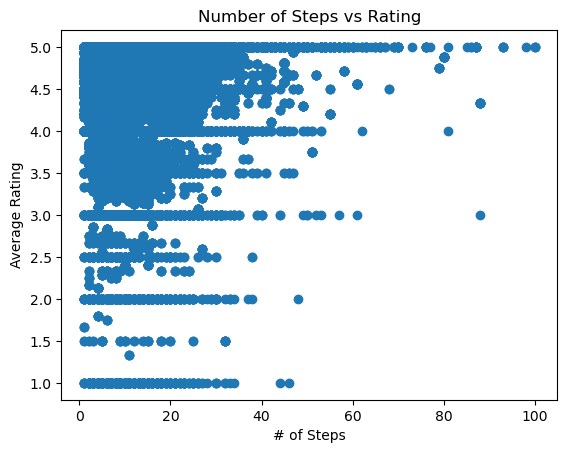

In [54]:
plt.scatter(total_df['n_steps'], total_df['avg_rating'])
plt.title('Number of Steps vs Rating')
plt.xlabel('# of Steps')
plt.ylabel("Average Rating")
plt.show()

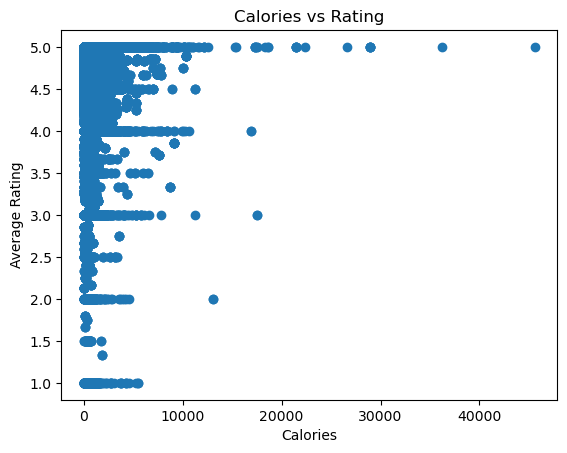

In [48]:
plt.scatter(total_df['calories_(#)'], total_df['avg_rating'])
plt.title('Calories vs Rating')
plt.xlabel('Calories')
plt.ylabel("Average Rating")
plt.show()

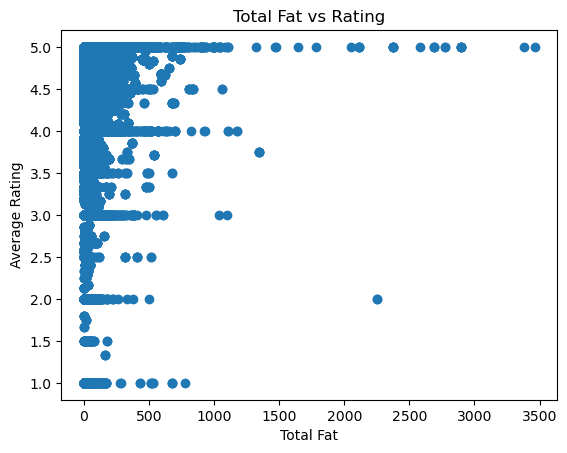

In [49]:
plt.scatter(total_df['total_fat_(PDV)'], total_df['avg_rating'])
plt.title('Total Fat vs Rating')
plt.xlabel('Total Fat')
plt.ylabel("Average Rating")
plt.show()

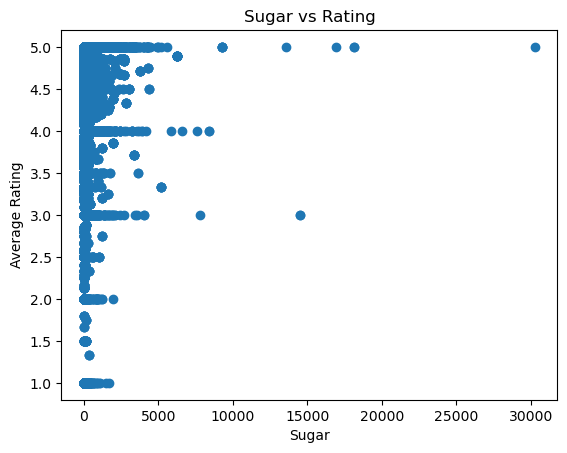

In [50]:
plt.scatter(total_df['sugar_(PDV)'], total_df['avg_rating'])
plt.title('Sugar vs Rating')
plt.xlabel('Sugar')
plt.ylabel("Average Rating")
plt.show()

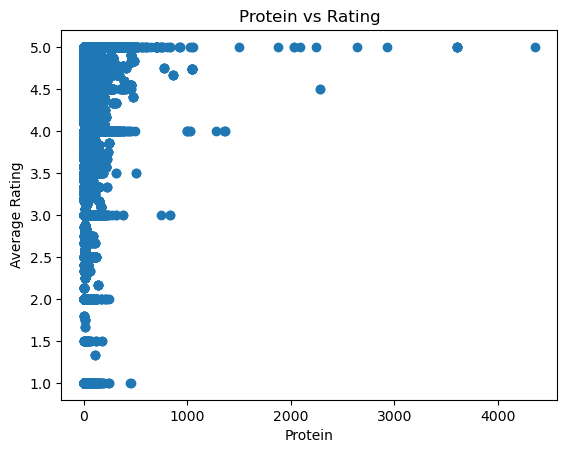

In [51]:
plt.scatter(total_df['protein_(PDV)'], total_df['avg_rating'])
plt.title('Protein vs Rating')
plt.xlabel('Protein')
plt.ylabel("Average Rating")
plt.show()

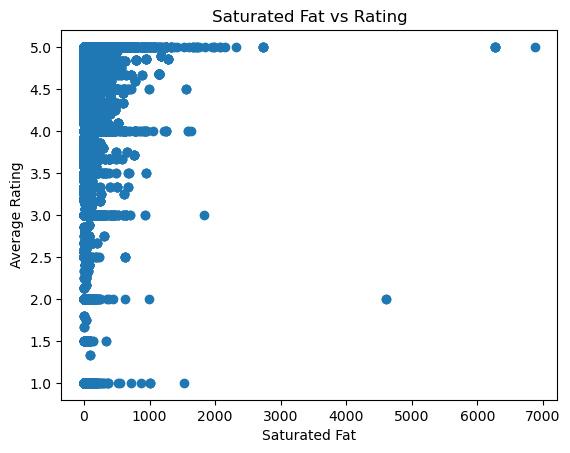

In [52]:
plt.scatter(total_df['saturated_fat_(PDV)'], total_df['avg_rating'])
plt.title('Saturated Fat vs Rating')
plt.xlabel('Saturated Fat')
plt.ylabel("Average Rating")
plt.show()

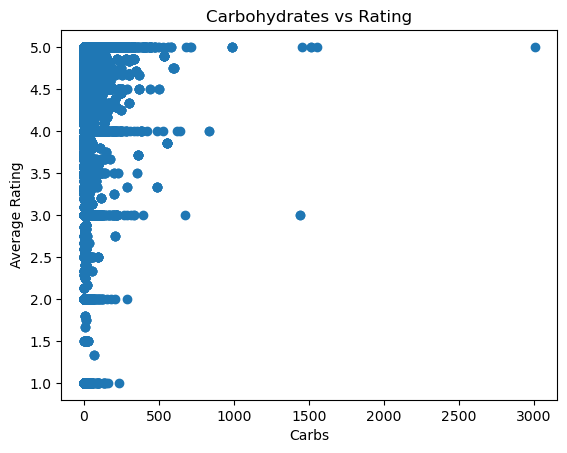

In [53]:
plt.scatter(total_df['carbohydrates_(PDV)'], total_df['avg_rating'])
plt.title('Carbohydrates vs Rating')
plt.xlabel('Carbs')
plt.ylabel("Average Rating")
plt.show()

In [13]:
df2 = total_df.groupby('n_ingredients')['avg_rating'].mean()


In [14]:
fig = px.line(df2)
fig.update_layout(title='n_ingredients vs avg_rating', xaxis_title='n_ingredients', yaxis_title='avg_rating')

In [15]:
df3 = total_df.groupby('avg_rating')['calories_(#)'].mean()
fig = px.line(df3)
fig.update_layout(title='avg_rating vs calories_(#)', xaxis_title='avg_rating', yaxis_title='calories_(#)')

##### Interesting Aggregates

In [16]:
protein_rating = total_df.groupby('avg_rating')['protein_(PDV)'].agg(['mean', 'median', 'min', 'max'])
protein_rating.columns = ['protein_mean', 'protein_median', 'protein_min', 'protein_max']
protein_rating

,protein_mean,protein_median,protein_min,protein_max
avg_rating,,,,
1.000000,29.500717,12.0,0.0,459.0
1.333333,111.000000,111.0,111.0,111.0
1.500000,33.688889,15.0,0.0,173.0
1.666667,9.000000,9.0,9.0,9.0
1.750000,9.000000,9.0,9.0,9.0
...,...,...,...,...
4.973684,25.000000,25.0,25.0,25.0
4.977273,36.000000,36.0,36.0,36.0
4.981132,21.000000,21.0,21.0,21.0


In [17]:
fig = px.line(total_df.groupby('n_ingredients')['total_fat_(PDV)'].mean())
fig.update_layout(title='n_ingredients vs total_fat_(PDV)', xaxis_title='n_ingredients', yaxis_title='total_fat_(PDV)')

In [18]:
total_df_temp = total_df.copy()

In [19]:
bins = [0, 0.5, 1, 1.5, 2, 2.5, 3, 3.5, 4, 4.5, 5]
labels = ['0-0.5', '0.5-1', '1-1.5', '1.5-2', '2-2.5', '2.5-3', '3-3.5', '3.5-4', '4-4.5', '4.5-5']
total_df_temp['avg_rating_bins'] = pd.cut(total_df_temp['avg_rating'], bins=bins, labels=labels, right=False)

In [20]:
protein_rating_temp = total_df_temp.groupby('avg_rating_bins')['protein_(PDV)'].agg(['mean', 'median', 'min', 'max'])
protein_rating_temp.columns = ['protein_mean', 'protein_median', 'protein_min', 'protein_max']
protein_rating_temp

,protein_mean,protein_median,protein_min,protein_max
avg_rating_bins,,,,
0-0.5,NaN,NaN,NaN,NaN
0.5-1,NaN,NaN,NaN,NaN
1-1.5,29.850000,13.0,0.0,459.0
1.5-2,27.741379,12.0,0.0,173.0
2-2.5,29.293567,15.0,0.0,246.0
2.5-3,27.335260,12.0,0.0,120.0
3-3.5,33.131627,17.0,0.0,835.0
3.5-4,33.550271,19.0,0.0,505.0
4-4.5,35.674578,20.0,0.0,1361.0


## Step 3: Assessment of Missingness

To check if there's any column with missing values

In [21]:
missing_values_columns = total_df_temp.columns[total_df_temp.isna().any()].tolist()

In [22]:
missing_values_columns

['rating', 'review', 'avg_rating', 'avg_rating_bins']

In [23]:
total_df_temp.columns

Index(['minutes', 'tags', 'n_steps', 'n_ingredients', 'rating', 'review',
       'avg_rating', 'calories_(#)', 'total_fat_(PDV)', 'sugar_(PDV)',
       'sodium_(PDV)', 'protein_(PDV)', 'saturated_fat_(PDV)',
       'carbohydrates_(PDV)', 'avg_rating_bins'],
      dtype='object')

Permutation Test setup

In [24]:
total_df_temp['review_missing'] = total_df_temp['review'].isna()
total_df_temp.head(5)

,minutes,tags,n_steps,n_ingredients,rating,review,avg_rating,calories_(#),total_fat_(PDV),sugar_(PDV),sodium_(PDV),protein_(PDV),saturated_fat_(PDV),carbohydrates_(PDV),avg_rating_bins,review_missing
0,40,"[60-minutes-or-less, time-to-make, course, mai...",10,9,4.0,"These were pretty good, but took forever to ba...",4.0,138.4,10.0,50.0,3.0,3.0,19.0,6.0,4-4.5,False
1,45,"[60-minutes-or-less, time-to-make, cuisine, pr...",12,11,5.0,Originally I was gonna cut the recipe in half ...,5.0,595.1,46.0,211.0,22.0,13.0,51.0,26.0,NaN,False
2,40,"[60-minutes-or-less, time-to-make, course, mai...",6,9,5.0,This was one of the best broccoli casseroles t...,5.0,194.8,20.0,6.0,32.0,22.0,36.0,3.0,NaN,False
3,40,"[60-minutes-or-less, time-to-make, course, mai...",6,9,5.0,I made this for my son's first birthday party ...,5.0,194.8,20.0,6.0,32.0,22.0,36.0,3.0,NaN,False
4,40,"[60-minutes-or-less, time-to-make, course, mai...",6,9,5.0,Loved this. Be sure to completely thaw the br...,5.0,194.8,20.0,6.0,32.0,22.0,36.0,3.0,NaN,False


#### Review vs Calories

In [25]:
n_repetitions = 500
shuffled = total_df_temp.copy()

diff_means = []
for _ in range(n_repetitions):
    
    # Shuffling the values, while keeping the group labels in place.
    shuffled['calories_(#)'] = np.random.permutation(shuffled['calories_(#)'])
    
    # Computing and storing the absolute difference in means.
    diff_mean = shuffled.groupby('review_missing')['calories_(#)'].mean().diff().abs().iloc[-1]
    diff_means.append(diff_mean)

In [26]:
observed_diff = total_df_temp.groupby('review_missing')['calories_(#)'].mean().diff().abs().iloc[-1]
fig = px.histogram(pd.DataFrame(diff_means), x=0, nbins=50, histnorm='probability', 
                   title='Empirical Distribution of the Absolute Difference in Means')
fig.add_vline(x=observed_diff, line_color='red', line_width=1, opacity=1)
fig.add_annotation(text=f'<span style="color:red">Observed Absolute Difference in Means = {round(observed_diff, 2)}</span>',
                   x=2 * observed_diff, showarrow=False, y=0.07)

In [27]:
np.mean(np.array(diff_means) >= observed_diff)

0.002

In [28]:
import plotly.figure_factory as ff
def create_kde_plotly(df, group_col, group1, group2, vals_col, title=''):
    fig = ff.create_distplot(
        hist_data=[df.loc[df[group_col] == group1, vals_col], df.loc[df[group_col] == group2, vals_col]],
        group_labels=[group1, group2],
        show_rug=False, show_hist=False
    )
    return fig.update_layout(title=title)
create_kde_plotly(total_df_temp, 'review_missing', True, False, 'calories_(#)', f'Calories by Missingness of reviews')

Hence, it does depend.

#### Review vs Minutes

In [29]:
n_repetitions = 500
shuffled = total_df_temp.copy()

diff_means = []
for _ in range(n_repetitions):
    
    # Shuffling the values, while keeping the group labels in place.
    shuffled['minutes'] = np.random.permutation(shuffled['minutes'])
    
    # Computing and storing the absolute difference in means.
    diff_mean = shuffled.groupby('review_missing')['minutes'].mean().diff().abs().iloc[-1]
    diff_means.append(diff_mean)
observed_diff = total_df_temp.groupby('review_missing')['minutes'].mean().diff().abs().iloc[-1]
fig = px.histogram(pd.DataFrame(diff_means), x=0, nbins=50, histnorm='probability', 
                   title='Empirical Distribution of the Absolute Difference in Means')
fig.add_vline(x=observed_diff, line_color='red', line_width=1, opacity=1)
fig.add_annotation(text=f'<span style="color:red">Observed Absolute Difference in Means = {round(observed_diff, 2)}</span>',
                   x=2 * observed_diff, showarrow=False, y=0.07)

In [30]:
np.mean(np.array(diff_means) >= observed_diff)

0.664

In [31]:
create_kde_plotly(total_df_temp, 'review_missing', True, False, 'minutes', f'Minutes by Missingness of reviews')

Hence, it does not depend

## SOME OTHER STUFF

In [ ]:
# pairplot = sns.pairplot(total_df_temp)
# plt.show()

In [51]:
total_df_temp.head(3)

,minutes,tags,n_steps,n_ingredients,rating,review,avg_rating,calories_(#),total_fat_(PDV),sugar_(PDV),sodium_(PDV),protein_(PDV),saturated_fat_(PDV),carbohydrates_(PDV),avg_rating_bins,review_missing
0,40,"[60-minutes-or-less, time-to-make, course, mai...",10,9,4.0,"These were pretty good, but took forever to ba...",4.0,138.4,10.0,50.0,3.0,3.0,19.0,6.0,4-4.5,False
1,45,"[60-minutes-or-less, time-to-make, cuisine, pr...",12,11,5.0,Originally I was gonna cut the recipe in half ...,5.0,595.1,46.0,211.0,22.0,13.0,51.0,26.0,NaN,False
2,40,"[60-minutes-or-less, time-to-make, course, mai...",6,9,5.0,This was one of the best broccoli casseroles t...,5.0,194.8,20.0,6.0,32.0,22.0,36.0,3.0,NaN,False


In [52]:
# heatmap = sns.heatmap(total_df_temp.corr(), annot=True, center=0, fmt=".1g")
# heatmap

## Step 4: Hypothesis Testing

Question: 

NULL: 

Alternate:

stat: 

In [87]:
total_df_temp.columns

Index(['minutes', 'tags', 'n_steps', 'n_ingredients', 'rating', 'review',
       'avg_rating', 'calories_(#)', 'total_fat_(PDV)', 'sugar_(PDV)',
       'sodium_(PDV)', 'protein_(PDV)', 'saturated_fat_(PDV)',
       'carbohydrates_(PDV)', 'avg_rating_bins', 'review_missing'],
      dtype='object')

In [88]:
hypo_df = total_df_temp[['n_steps', 'protein_(PDV)', 'avg_rating']]
hypo_df

,n_steps,protein_(PDV),avg_rating
0,10,3.0,4.0
1,12,13.0,5.0
2,6,22.0,5.0
...,...,...,...
234426,5,4.0,3.0
234427,5,4.0,3.0
234428,5,4.0,3.0


In [89]:
def categorize_work(n_steps):
    if n_steps <= 10:
        return 'Little Work'
    elif 10 <= n_steps <= 25:
        return 'Significant Work'
    else:
        return 'Extreme Work'
    
hypo_df['work_category'] = hypo_df['n_steps'].apply(categorize_work)
hypo_df

,n_steps,protein_(PDV),avg_rating,work_category
0,10,3.0,4.0,Little Work
1,12,13.0,5.0,Significant Work
2,6,22.0,5.0,Little Work
...,...,...,...,...
234426,5,4.0,3.0,Little Work
234427,5,4.0,3.0,Little Work
234428,5,4.0,3.0,Little Work


In [90]:
hypo_df['work_category'].value_counts()

Little Work         147750
Significant Work     80686
Extreme Work          5993
Name: work_category, dtype: int64